# Preprocessing Pipeline

## Create folder structures

**Prerequisites:**
- Existing folders and files in root directory:
    - `./data/raw-train/images/`
    - `./data/raw-train/tiger-coco.json`
    - `/data/raw-test/images/`
    - `/data/raw-test/masks/`
    - `./data/processed-train/`
    - `/data/processed-test/`

In [1]:
import os

# Directories
dirs = [
    "./data/processed-train/hematoxylin_eq",
    "./data/processed-train/normalized_eq",
    "./data/processed-train/eq",
    "./data/processed-train/patches",
    "./data/processed-train/masks",
    "./data/processed-test/binary_masks",
    "./data/processed-test/scaled",
    "./data/processed-test/patches"
]

for directory in dirs:
    os.makedirs(directory, exist_ok=True)

In [3]:
from src.image_preprocessor import ImageProcessor, InplaceOption, k_split

# Initialize processors
train_processor = ImageProcessor("./data/raw-train/images")
test_processor = ImageProcessor("./data/raw-test/images")

## Select reference images for normalization

In [3]:
train_target = train_processor.select_random_images(8)
test_target = test_processor.select_random_images(2)
targets = train_target + test_target

## Generate pseudo-masks for training set

In [4]:
# Normalize train set and separate hematoxylin and eosin stains and save the hematoxylin images into the object
train_processor.normalize(targets, out_dir="./data/processed-train", inplace=True, inplace_option=InplaceOption.HEMATOXYLIN)

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'norm_image': array([[[128,  78, 118],
          [129,  78, 117],
          [120,  69, 108],
          ...,
          [170, 139, 191],
          [172, 142, 194],
          [184, 159, 205]],
  
         [[132,  81, 118],
          [120,  68, 105],
          [111,  59,  97],
          ...,
          [154, 116, 172],
          [172, 141, 191],
          [186, 161, 207]],
  
         [[121,  66,  99],
          [107,  53,  86],
          [116,  63,  97],
          ...,
          [154, 117, 174],
          [170, 139, 191],
          [178, 150, 198]],
  
         ...,
  
         [[116,  62,  93],
          [106,  52,  85],
          [121,  67, 100],
          ...,
          [177, 140, 173],
          [169, 128, 162],
          [170, 129, 163]],
  
         [[119,  65,  98],
          [120,  66,  99],
          [136,  83, 116],
          ...,
          [186, 155, 187],
          [16

In [5]:
# Perform histogram equalization on the hematoxylin images
train_processor.equalize_hist(out_dir="./data/processed-train/hematoxylin_eq")

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'equalized_img': array([[[ 58,  38,  47],
          [ 54,  35,  44],
          [ 41,  25,  32],
          ...,
          [240, 225, 233],
          [242, 229, 235],
          [248, 240, 244]],
  
         [[ 54,  35,  44],
          [ 35,  21,  27],
          [ 26,  15,  19],
          ...,
          [221, 196, 208],
          [239, 223, 232],
          [249, 242, 246]],
  
         [[ 22,  12,  17],
          [ 10,   5,   7],
          [ 22,  12,  16],
          ...,
          [225, 200, 213],
          [240, 225, 233],
          [244, 233, 239]],
  
         ...,
  
         [[ 15,   8,  11],
          [ 10,   5,   7],
          [ 25,  14,  19],
          ...,
          [185, 155, 170],
          [153, 122, 138],
          [153, 123, 138]],
  
         [[ 22,  12,  17],
          [ 22,  12,  17],
          [ 44,  28,  35],
          ...,
          [217, 192, 205],
          

In [6]:
# Set the normalized images to the object and perform histogram equalization on them
train_processor.set_images_from_dir(images_dir="./data/processed-train/normalized")
train_processor.equalize_hist(out_dir="./data/processed-train/normalized_eq")

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'equalized_img': array([[[ 37,  22,  34],
          [ 39,  23,  35],
          [ 25,  14,  22],
          ...,
          [197, 161, 221],
          [201, 166, 227],
          [216, 187, 241]],
  
         [[ 44,  26,  39],
          [ 25,  14,  21],
          [ 14,   7,  12],
          ...,
          [150, 113, 168],
          [200, 163, 221],
          [217, 188, 242]],
  
         [[ 26,  14,  21],
          [ 10,   4,   7],
          [ 19,  10,  15],
          ...,
          [153, 117, 174],
          [197, 161, 221],
          [208, 176, 233]],
  
         ...,
  
         [[ 19,  10,  15],
          [  9,   4,   7],
          [ 26,  14,  21],
          ...,
          [184, 146, 180],
          [157, 119, 151],
          [160, 121, 154]],
  
         [[ 23,  12,  18],
          [ 25,  13,  20],
          [ 53,  32,  45],
          ...,
          [212, 176, 213],
          

In [7]:
# Set the base (raw) images to the object and perform histogram equalization on them
train_processor.set_images_from_dir(images_dir="./data/raw-train/images")
train_processor.equalize_hist(out_dir="./data/processed-train/eq")

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'equalized_img': array([[[ 18,  13,  19],
          [ 18,  13,  19],
          [  9,   6,   8],
          ...,
          [196, 149, 220],
          [201, 154, 225],
          [220, 172, 240]],
  
         [[ 22,  15,  21],
          [ 10,   6,   9],
          [  5,   3,   4],
          ...,
          [148, 107, 168],
          [200, 153, 220],
          [221, 174, 241]],
  
         [[ 16,   9,  13],
          [  5,   2,   4],
          [ 12,   6,  10],
          ...,
          [154, 111, 175],
          [196, 149, 220],
          [212, 164, 232]],
  
         ...,
  
         [[ 22,  10,  17],
          [ 12,   5,   9],
          [ 28,  14,  23],
          ...,
          [183, 140, 179],
          [148, 111, 143],
          [152, 114, 147]],
  
         [[ 28,  13,  22],
          [ 30,  15,  24],
          [ 58,  33,  48],
          ...,
          [212, 167, 211],
          

In [9]:
from src.mask_generator import MaskGenerator, MaskOperations as mo

# Initialize the generator object
generator = MaskGenerator(json_file_path="./data/raw-train/tiger-coco.json")

### Masks generation settings

We now work with different image sources (6) and different sequences of operations (4) that are being used to generate the **pseudo-masks**:

Image sources:
- Raw images
- Raw images + histogram equalization
- Normalized images
- Normalized images + histogram equalization
- Hematoxylin-separated images
- Hematoxylin-separated images + histogram equalization

Sequences of operations:
- single cell cutting --> gaussian blur --> adaptive thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed
- single cell cutting --> gaussian blur --> otsu's thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed
- single cell cutting --> adaptive thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed
- single cell cutting --> otsu's thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed

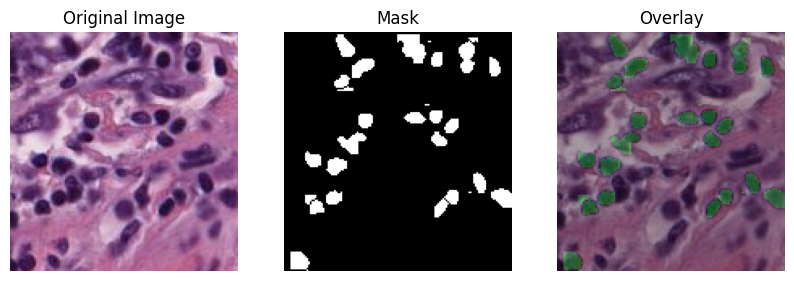

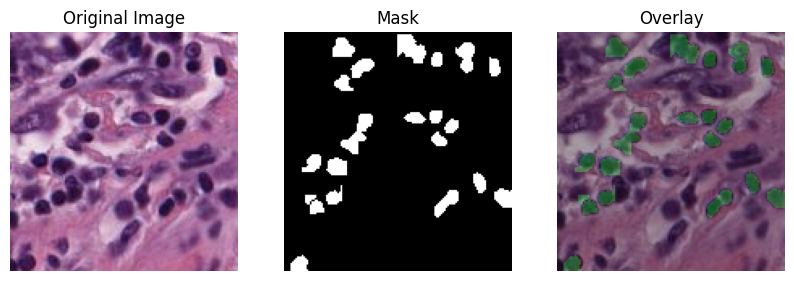

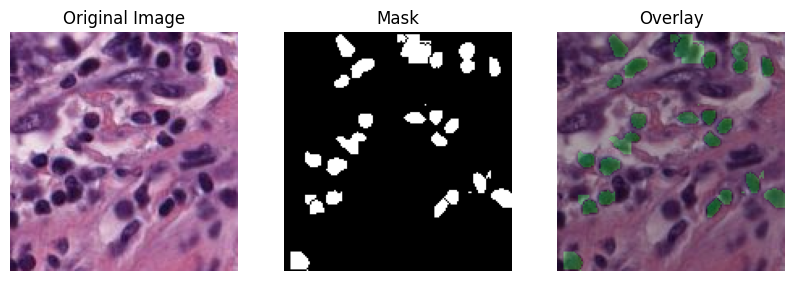

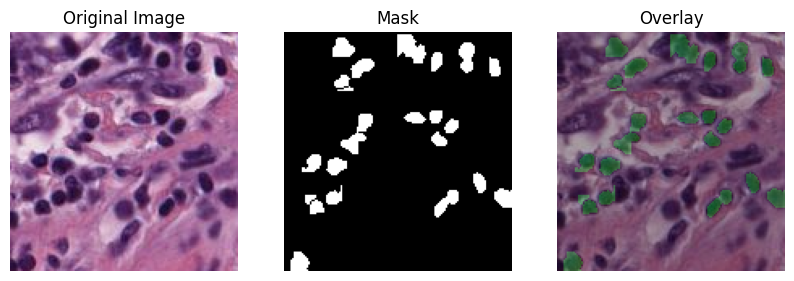

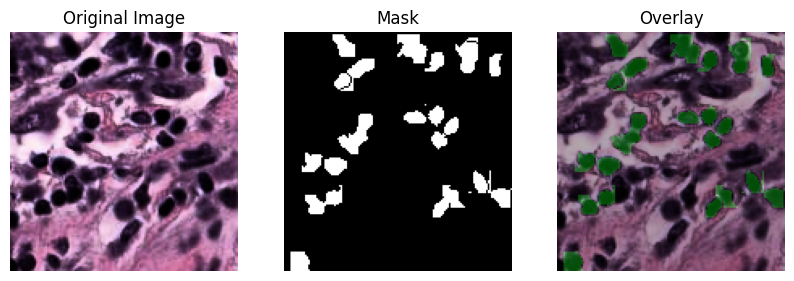

...

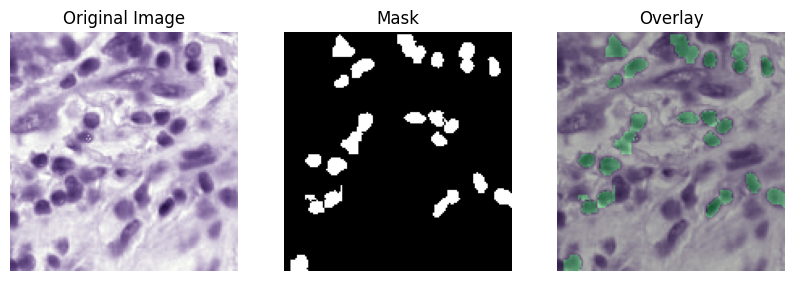

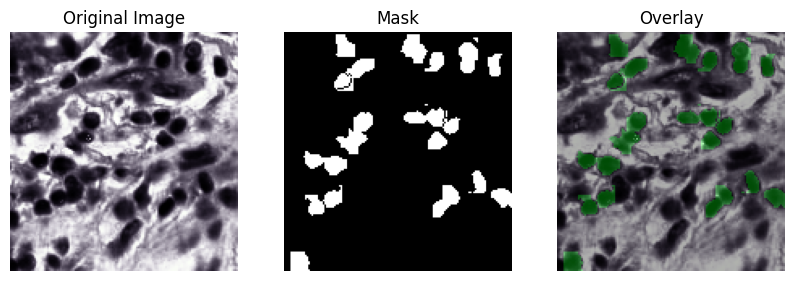

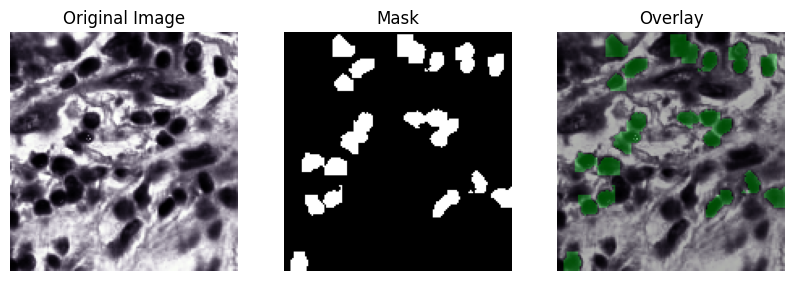

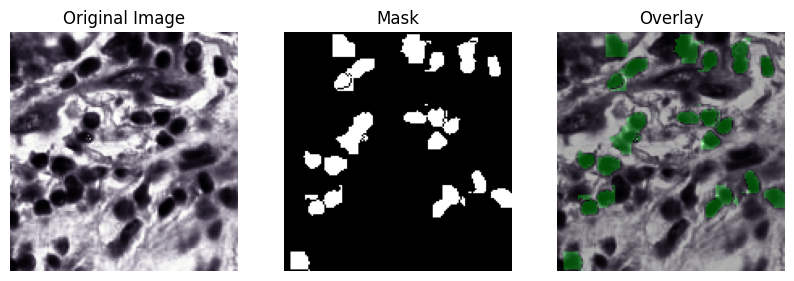

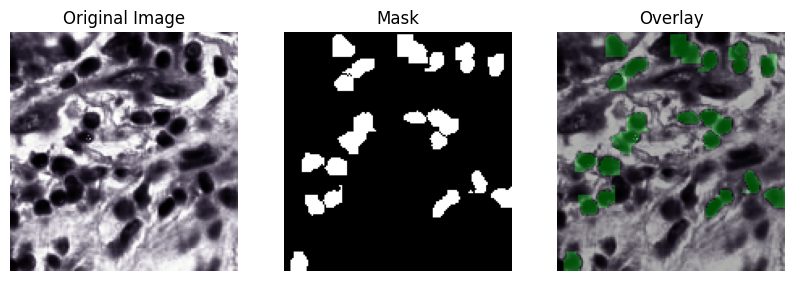

In [9]:
# Define the source folders
source_folders = [("raw", "./data/raw-train/images"), 
                  ("raw_eq", "./data/processed-train/eq"), 
                  ("normalized", "./data/processed-train/normalized"), 
                  ("normalized_eq", "./data/processed-train/normalized_eq"), 
                  ("hematoxylin", "./data/processed-train/hematoxylin"),
                  ("hematoxylin_eq", "./data/processed-train/hematoxylin_eq")]

# Define the operation pipelines
operation_pipelines = [("blur_adaptive", [mo.BLUR, mo.ADAPTIVE_THRESHOLD, mo.MORPH_OPENING, mo.MARKED_WATERSHED, mo.COMBINE_MASKS]),
                       ("blur_otsu", [mo.BLUR, mo.OTSU_THRESHOLD, mo.MORPH_OPENING, mo.MARKED_WATERSHED, mo.COMBINE_MASKS]),
                       ("adaptive", [mo.ADAPTIVE_THRESHOLD, mo.MORPH_OPENING, mo.MARKED_WATERSHED, mo.COMBINE_MASKS]),
                       ("otsu", [mo.OTSU_THRESHOLD, mo.MORPH_OPENING, mo.MARKED_WATERSHED, mo.COMBINE_MASKS])]

# Create output folders
parent_dir = "./data/processed-train/masks"
mask_dirs = []
for folder_name, folder_path in source_folders:
    for operation_name, operations in operation_pipelines:
        out_dir = os.path.join(parent_dir, "_".join([folder_name, operation_name]))
        os.makedirs(out_dir, exist_ok=True)
        mask_dirs.append(out_dir)
        generator.set_dir(images_dir=folder_path)
        generator.run(out_dir=out_dir, operations=operations, visualize_range=(12, 13))  # and display 12th image for comparison

In [21]:
# Fuse the masks using voting strategy
selected_mask_dirs_all = [
    "hematoxylin_adaptive", "hematoxylin_otsu", "hematoxylin_blur_adaptive", "hematoxylin_blur_otsu", 
                 "hematoxylin_eq_adaptive", "hematoxylin_eq_otsu", "hematoxylin_eq_blur_adaptive", "hematoxylin_eq_blur_otsu", 
                 "normalized_adaptive", "normalized_otsu", "normalized_blur_adaptive", "normalized_blur_otsu", 
                 "normalized_eq_adaptive", "normalized_eq_otsu", "normalized_eq_blur_adaptive", "normalized_eq_blur_otsu",
                 "raw_adaptive", "raw_otsu", "raw_blur_adaptive", "raw_blur_otsu", 
                 "raw_eq_adaptive", "raw_eq_otsu", "raw_eq_blur_adaptive", "raw_eq_blur_otsu"
]
selected_mask_dirs_best_25 = ["normalized_eq_adaptive", "normalized_eq_otsu", "hematoxylin_eq_blur_otsu", "normalized_eq_blur_adaptive", "raw_otsu", "normalized_blur_otsu"]
selected_mask_dirs_best_50 = (["raw_eq_adaptive", "hematoxylin_blur_otsu", "normalized_eq_blur_otsu", "normalized_adaptive", "hematoxylin_eq_blur_adaptive", "hematoxylin_blur_adaptive"]
                              + selected_mask_dirs_best_25)
selected_mask_dirs_best_75 = ["normalized_eq_adaptive", "raw_eq_blur_adaptive", "raw_adaptive", "raw_blur_otsu", "raw_eq_otsu", "normalized_otsu"] + selected_mask_dirs_best_50

selected_mask_dirs_all = [os.path.join("./data/processed-train/masks", m) for m in selected_mask_dirs_all]
selected_mask_dirs_best_25 = [os.path.join("./data/processed-train/masks", m) for m in selected_mask_dirs_best_25]
selected_mask_dirs_best_50 = [os.path.join("./data/processed-train/masks", m) for m in selected_mask_dirs_best_50]
selected_mask_dirs_best_75 = [os.path.join("./data/processed-train/masks", m) for m in selected_mask_dirs_best_75]

os.makedirs("./data/processed-train/masks/fused_all", exist_ok=True)
os.makedirs("./data/processed-train/masks/fused_best_25", exist_ok=True)
os.makedirs("./data/processed-train/masks/fused_best_50", exist_ok=True)
os.makedirs("./data/processed-train/masks/fused_best_75", exist_ok=True)

os.makedirs("./data/processed-train/masks/fused_exclude_0", exist_ok=True)
os.makedirs("./data/processed-train/masks/fused_exclude_1", exist_ok=True)
os.makedirs("./data/processed-train/masks/fused_exclude_2", exist_ok=True)
os.makedirs("./data/processed-train/masks/fused_exclude_3", exist_ok=True)

generator.set_dir(images_dir="./data/raw-train/images")

generator.fuse_masks(mask_dirs=selected_mask_dirs_all, out_dir="./data/processed-train/masks/fused_all", vote_pixel=0.02)
generator.fuse_masks(mask_dirs=selected_mask_dirs_best_25, out_dir="./data/processed-train/masks/fused_best_25", vote_pixel=0.02)
generator.fuse_masks(mask_dirs=selected_mask_dirs_best_50, out_dir="./data/processed-train/masks/fused_best_50", vote_pixel=0.02)
generator.fuse_masks(mask_dirs=selected_mask_dirs_best_75, out_dir="./data/processed-train/masks/fused_best_75", vote_pixel=0.02)

#generator.fuse_masks(mask_dirs=selected_mask_dirs_all, out_dir="./data/processed-train/masks/fused_exclude_0", vote_pixel=1.0)
#generator.fuse_masks(mask_dirs=selected_mask_dirs_all, out_dir="./data/processed-train/masks/fused_exclude_1", vote_pixel=0.95)
#generator.fuse_masks(mask_dirs=selected_mask_dirs_all, out_dir="./data/processed-train/masks/fused_exclude_2", vote_pixel=0.9)


In [32]:
os.makedirs("./data/processed-train/masks/fused_exclude_3", exist_ok=True)
generator.fuse_masks(mask_dirs=selected_mask_dirs_all, out_dir="./data/processed-train/masks/fused_exclude_3", vote_pixel=0.875)

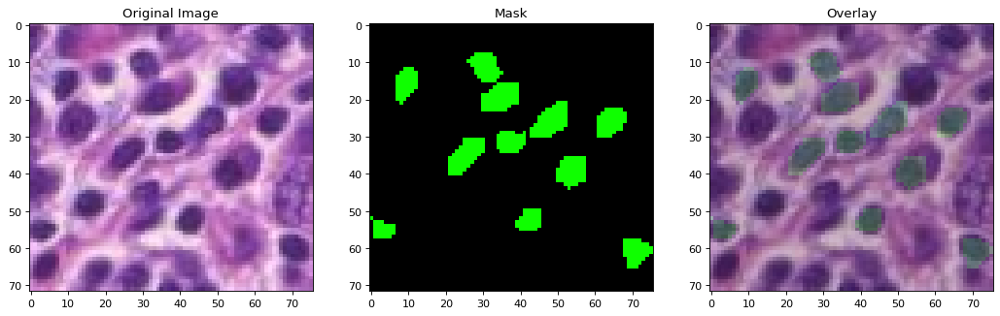

In [35]:
from src.sample import Sample

sample = Sample(img_path="./data/raw-train/images/TCGA-OL-A66P-01Z-00-DX1.5ADD0D6D-37C6-4BC9-8C2B-64DB18BE99B3_[8745, 6739, 8821, 6811].png",
                mask_path="./data/processed-train/masks/fused_exclude_3/TCGA-OL-A66P-01Z-00-DX1.5ADD0D6D-37C6-4BC9-8C2B-64DB18BE99B3_[8745, 6739, 8821, 6811].png")
sample.show(with_mask=True)

## Preprocess train set for the model training

In [36]:
# Set the normalized images to train processor
train_processor.set_images_from_dir("./data/processed-train/normalized")

In [39]:
# Create patches
train_processor.extract_patches(masks_dirs=[
    "./data/processed-train/masks/fused_exclude_0", "./data/processed-train/masks/fused_exclude_1", "./data/processed-train/masks/fused_exclude_2", 
    "./data/processed-train/masks/fused_exclude_3", "./data/processed-train/masks/fused_all", "./data/processed-train/masks/fused_best_75",
    "./data/processed-train/masks/fused_best_50", "./data/processed-train/masks/fused_best_25"], out_dir="./data/processed-train/patches/")

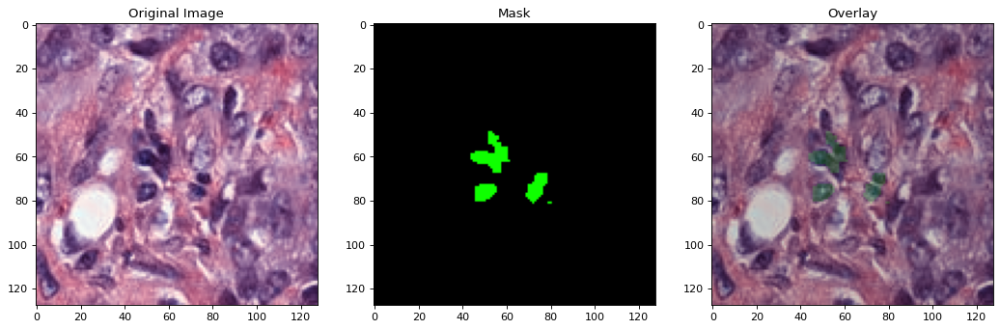

In [50]:
sample = Sample(img_path="./data/processed-train/patches/images/TCGA-S3-AA15-01Z-00-DX1.A2456A4A-E6E8-4429-8F09-B997AA497BB0_[28364, 14576, 28516, 14727]_(23_24).png",
                mask_path="./data/processed-train/patches/masks/fused_exclude_3/TCGA-S3-AA15-01Z-00-DX1.A2456A4A-E6E8-4429-8F09-B997AA497BB0_[28364, 14576, 28516, 14727]_(23_24).png")
sample.show(with_mask=True)

## Preprocess test set

In [19]:
# Normalize test set
test_processor.normalize(targets, out_dir="./data/processed-test", inplace=True)

[{'img_name': '09_6.png',
  'norm_image': array([[[194, 158, 174],
          [189, 151, 169],
          [185, 144, 162],
          ...,
          [195, 161, 179],
          [195, 161, 179],
          [193, 157, 174]],
  
         [[191, 154, 171],
          [188, 150, 167],
          [185, 144, 162],
          ...,
          [193, 157, 174],
          [193, 157, 174],
          [190, 152, 170]],
  
         [[188, 150, 167],
          [188, 148, 166],
          [186, 145, 163],
          ...,
          [190, 152, 170],
          [190, 152, 170],
          [188, 148, 165]],
  
         ...,
  
         [[194, 158, 173],
          [194, 158, 173],
          [194, 158, 173],
          ...,
          [174, 143, 191],
          [153, 111, 157],
          [183, 150, 183]],
  
         [[194, 158, 173],
          [194, 158, 173],
          [194, 158, 173],
          ...,
          [176, 145, 190],
          [175, 140, 178],
          [186, 151, 178]],
  
         [[194, 158, 173],
          [

In [20]:
# Relabel multiclass masks to binary masks
test_processor.relabel_binary(masks_dir="./data/raw-test/masks", out_dir="./data/processed-test/binary_masks", target_class=2)

In [21]:
# Scale from 40x magnification to 20x magnification
test_processor.scale(masks_dirs=["./data/processed-test/binary_masks"], out_dir="./data/processed-test/scaled", factor=0.5, inplace=True)

In [6]:
# Create patches
test_processor.set_images_from_dir(images_dir="./data/processed-test/scaled/images")
test_processor.extract_patches(masks_dirs=["./data/processed-test/scaled/masks"], out_dir="./data/processed-test/patches")

In [4]:
k_split(source_dir="./data/processed-test/patches", out_dir="./data/processed-test/patches/folds")

## See some image statistics

In [4]:
from src.image_stats import ImageStats

train_stats = ImageStats("./data/processed-train/patches/images")
train_masks_stats = ImageStats("./data/processed-train/patches/masks")

test_stats = ImageStats("./data/processed-test/patches/images")
test_masks_stats = ImageStats("./data/processed-test/patches/masks")

Count: 19386

Average Width: 128.0
Average Height: 128.0
Average image area: 16384.0
Median Width: 128.0
Median Height: 128.0
Median Area: 16384.0
Min Width: 128
Min Height: 128
Min Area: 16384
Max Width: 128
Max Height: 128
Max Area: 16384


{'count': 19386,
 'avg_w': np.float64(128.0),
 'avg_h': np.float64(128.0),
 'avg_area': np.float64(16384.0),
 'med_w': np.float64(128.0),
 'med_h': np.float64(128.0),
 'med_area': np.float64(16384.0),
 'min_w': np.int64(128),
 'min_h': np.int64(128),
 'min_area': np.int64(16384),
 'max_w': np.int64(128),
 'max_h': np.int64(128),
 'max_area': np.int64(16384)}

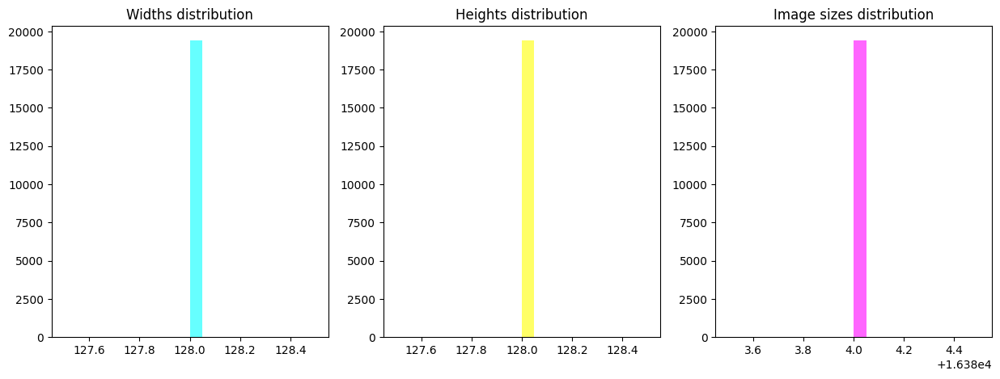

In [25]:
train_stats.get_image_stats(visual=True)

Count: 19386

Average Width: 128.0
Average Height: 128.0
Average image area: 16384.0
Median Width: 128.0
Median Height: 128.0
Median Area: 16384.0
Min Width: 128
Min Height: 128
Min Area: 16384
Max Width: 128
Max Height: 128
Max Area: 16384


{'count': 19386,
 'avg_w': np.float64(128.0),
 'avg_h': np.float64(128.0),
 'avg_area': np.float64(16384.0),
 'med_w': np.float64(128.0),
 'med_h': np.float64(128.0),
 'med_area': np.float64(16384.0),
 'min_w': np.int64(128),
 'min_h': np.int64(128),
 'min_area': np.int64(16384),
 'max_w': np.int64(128),
 'max_h': np.int64(128),
 'max_area': np.int64(16384)}

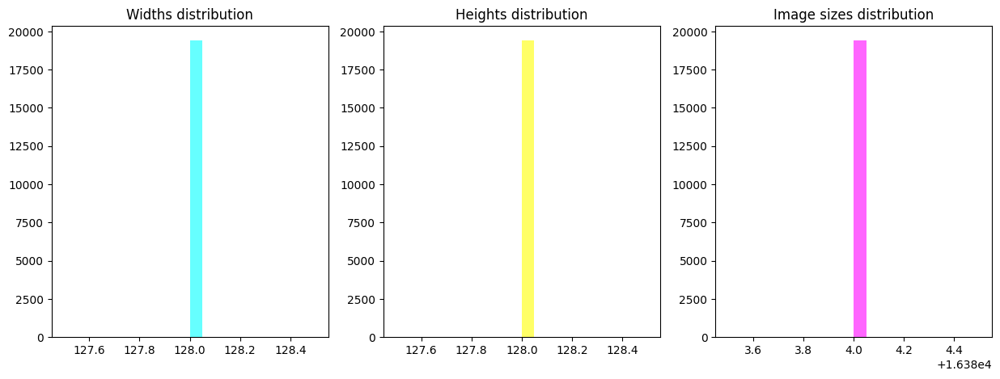

In [26]:
train_masks_stats.get_image_stats(visual=True)

Count: 200

Average Width: 128.0
Average Height: 128.0
Average image area: 16384.0
Median Width: 128.0
Median Height: 128.0
Median Area: 16384.0
Min Width: 128
Min Height: 128
Min Area: 16384
Max Width: 128
Max Height: 128
Max Area: 16384


{'count': 200,
 'avg_w': np.float64(128.0),
 'avg_h': np.float64(128.0),
 'avg_area': np.float64(16384.0),
 'med_w': np.float64(128.0),
 'med_h': np.float64(128.0),
 'med_area': np.float64(16384.0),
 'min_w': np.int64(128),
 'min_h': np.int64(128),
 'min_area': np.int64(16384),
 'max_w': np.int64(128),
 'max_h': np.int64(128),
 'max_area': np.int64(16384)}

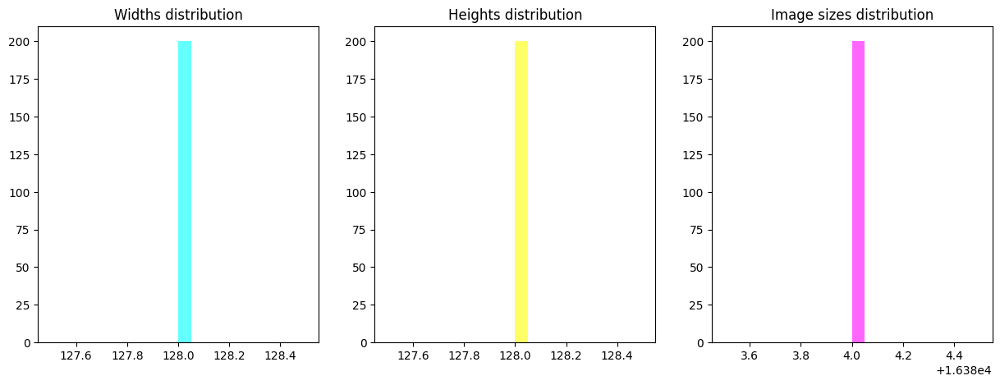

In [27]:
test_stats.get_image_stats(visual=True)

Count: 200

Average Width: 128.0
Average Height: 128.0
Average image area: 16384.0
Median Width: 128.0
Median Height: 128.0
Median Area: 16384.0
Min Width: 128
Min Height: 128
Min Area: 16384
Max Width: 128
Max Height: 128
Max Area: 16384


{'count': 200,
 'avg_w': np.float64(128.0),
 'avg_h': np.float64(128.0),
 'avg_area': np.float64(16384.0),
 'med_w': np.float64(128.0),
 'med_h': np.float64(128.0),
 'med_area': np.float64(16384.0),
 'min_w': np.int64(128),
 'min_h': np.int64(128),
 'min_area': np.int64(16384),
 'max_w': np.int64(128),
 'max_h': np.int64(128),
 'max_area': np.int64(16384)}

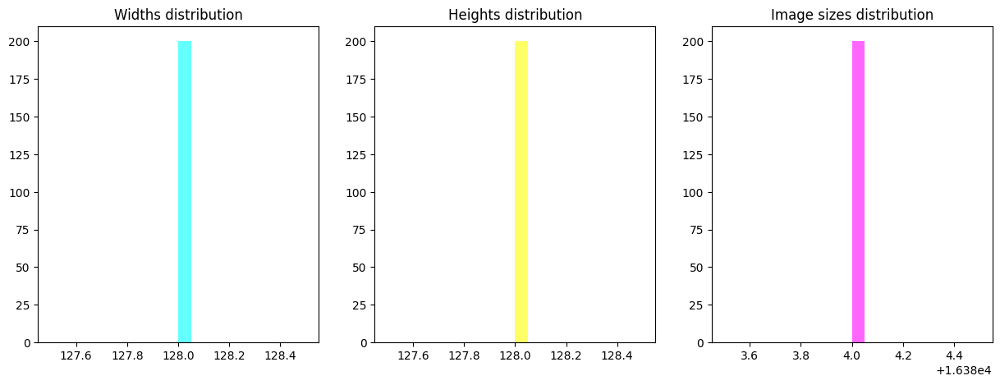

In [28]:
test_masks_stats.get_image_stats(visual=True)